# Concentrations from the NMSKO stations

A notebook for a quick display of concentrations meassured at NMSKO stations.
You need to specify the chosed period and pollutant.

pri date_time frekvencia W-MON robi tyzdenne priemery so zaciatkom v pondelok, tyzdenny priemer je oznaceny pondelkovym datumom buduceho tyzdna!!! velmi neintuitivne
https://stackoverflow.com/questions/49544421/why-does-pandas-roll-a-week-forward-when-using-resample-with-w-mon-frequency

## User input

In [107]:
### USER INPUT
# pre kazdy modelovy vstup treba zadat nazov modelu aj grid, aj ked tieto mozu byt pre rozne vstupy rovnake
# poradie nazvov v nasledujucich listoch treba dodrzat, teda prvy prvok v kazdom liste opisuje prvy vstup atd
nick = 'konc_jesen_2021'   # specificky nazov pre celu validaciu x modelov
folder_name = 'konc_jesen_2021'   #nazov zlozky vo validated foldri
start_date = '2021-10-01 00:00:00' # cele obdobie ktore chceme nahrat
end_date = '2021-12-06 23:59:59'

v = 'NO2'

colors = ['r,green','b','k','limegreen' ]   # farby pre modelove hodnoty v plotoch 

In [108]:
### NOT USER INPUT
import numpy as np
import pandas as pd
from IPython.display import Image, display
import matplotlib.pyplot as plt
vali_path = '/data/teri/validacia'
import os
import sys
sys.path.append(vali_path)
import koncentracie_na_staniciach as NMSKO
import xarray as xr

units = 'ug/m3'
locs = ['S','R','U']
types = ['B','T','I']
all_types = locs + types 
all_types_all = locs + types + ['all']
season = ['spring','summer','autumn','winter','year']
season_months = {'spring':[3,4,5], 'summer':[6,7,8], 'autumn':[9,10,11], 'winter':[1,11,12], 'year':list(range(1,13)),
                'jan':[1], 'feb':[2], 'mar':[3], 'apr':[4], 'may':[5], 'jun':[6], 'jul':[7], 'aug':[8],
                'sep':[9], 'okt':[10], 'nov':[11], 'dec':[12], 'let_cas':[4,5,6,7,8,9,10], 'zim_cas':[11,12,1,2,3]}

#statistiky = ['r','bias','rmse','mge']
#statistiky = ['r','bias','bias%','rmse','rmse%']
#statistiky = ['R','MB','MPE','MGE','MGPE','RMSE','RMSPE']
#statistiky = ['R','MB','MPE','RMSE','RMSPE']

stat = {}
data = {}
    
stanice = pd.read_csv('/data/teri/sezonalita_kv_ovzd/stanice_NMSKO_d02.csv')
pd.set_option('display.max_columns', 25)
stanice

,Unnamed: 0,id,ci,ii,name,cccc,cc,iso_cc,lat,lon,elev,info,...,SO2,NO,NO2,NOx,CO,BEN,H2S,O3,coord,x,y,lat_lon
0,0,78001,78,11813,"BRATISLAVA, JESENIOVA",NaN,SK,703,48.167952,17.106209,283.0,NaN,...,1,1,1,1,0,0,0,1,"(21, 92)",21,92,"(48.152134, 17.130432)"
1,1,78002,78,11916,"CHOPOK, EMEP",NaN,SK,703,48.943620,19.589236,1958.0,NaN,...,0,1,1,1,0,0,0,1,"(40, 130)",40,130,"(48.928993, 19.58075)"
2,2,78003,78,11952,"GANOVCE, METEO. ST.",NaN,SK,703,49.034601,20.322844,682.0,NaN,...,0,1,1,1,0,0,0,1,"(43, 141)",43,141,"(49.038628, 20.296814)"
3,3,78004,78,11958,KOJSOVSKA HOLA,NaN,SK,703,48.782875,20.987112,1230.0,NaN,...,0,1,1,1,0,0,0,1,"(37, 152)",37,152,"(48.76358, 20.986572)"
4,4,78005,78,99111,"BRATISLAVA, MAMATEYOVA",NaN,SK,703,48.124692,17.125400,134.0,NaN,...,1,1,1,1,0,0,1,1,"(20, 92)",20,92,"(48.10979, 17.13034)"
5,5,78006,78,99112,"BRATISLAVA, TRNAVSKE MYTO",NaN,SK,703,48.158359,17.128891,140.0,NaN,...,0,1,1,1,1,1,0,0,"(21, 92)",21,92,"(48.152134, 17.130432)"
6,6,78007,78,99114,"BRATISLAVA, KAMENNE NAM.",NaN,SK,703,48.144670,17.113543,146.0,NaN,...,0,0,0,0,0,0,0,0,"(21, 92)",21,92,"(48.152134, 17.130432)"
7,7,78008,78,99122,"SENICA, HVIEZDOSLAVOVA",NaN,SK,703,48.680681,17.363110,207.0,NaN,...,1,0,0,0,0,0,0,0,"(33, 96)",33,96,"(48.659653, 17.388062)"
8,8,78009,78,99123,"TRNAVA, KOLLAROVA",NaN,SK,703,48.371385,17.584926,144.0,NaN,...,0,1,1,1,1,1,0,0,"(26, 99)",26,99,"(48.36253, 17.577057)"
9,9,78038,78,99126,TRNOVEC NAD VAHOM,NaN,SK,703,48.150000,17.928600,114.0,NaN,...,0,0,0,0,0,0,0,0,"(21, 105)",21,105,"(48.14837, 17.955536)"


In [109]:
stat[v], data[v] = NMSKO.pozorovania(start_date, end_date, v)

Making connection to database 10.20.7.200
Working on query: 
select si.ii,si.lat,si.lon,si.elev, o.* from obs.obs_nmsko_1h o join si.si on si.id=o.si_id where ii=11813 and date between '2021-10-01 00:00:00' and '2021-12-06 23:59:59'
Making connection to database 10.20.7.200
Working on query: 
select si.ii,si.lat,si.lon,si.elev, o.* from obs.obs_nmsko_1h o join si.si on si.id=o.si_id where ii=11916 and date between '2021-10-01 00:00:00' and '2021-12-06 23:59:59'
Making connection to database 10.20.7.200
Working on query: 
select si.ii,si.lat,si.lon,si.elev, o.* from obs.obs_nmsko_1h o join si.si on si.id=o.si_id where ii=11952 and date between '2021-10-01 00:00:00' and '2021-12-06 23:59:59'
Making connection to database 10.20.7.200
Working on query: 
select si.ii,si.lat,si.lon,si.elev, o.* from obs.obs_nmsko_1h o join si.si on si.id=o.si_id where ii=11958 and date between '2021-10-01 00:00:00' and '2021-12-06 23:59:59'
Making connection to database 10.20.7.200
Working on query: 
select 

Making connection to database 10.20.7.200
Working on query: 
select si.ii,si.lat,si.lon,si.elev, o.* from obs.obs_nmsko_1h o join si.si on si.id=o.si_id where ii=99326 and date between '2021-10-01 00:00:00' and '2021-12-06 23:59:59'
Making connection to database 10.20.7.200
Working on query: 
select si.ii,si.lat,si.lon,si.elev, o.* from obs.obs_nmsko_1h o join si.si on si.id=o.si_id where ii=99334 and date between '2021-10-01 00:00:00' and '2021-12-06 23:59:59'
Making connection to database 10.20.7.200
Working on query: 
select si.ii,si.lat,si.lon,si.elev, o.* from obs.obs_nmsko_1h o join si.si on si.id=o.si_id where ii=99351 and date between '2021-10-01 00:00:00' and '2021-12-06 23:59:59'
Making connection to database 10.20.7.200
Working on query: 
select si.ii,si.lat,si.lon,si.elev, o.* from obs.obs_nmsko_1h o join si.si on si.id=o.si_id where ii=99352 and date between '2021-10-01 00:00:00' and '2021-12-06 23:59:59'
Making connection to database 10.20.7.200
Working on query: 
select 

In [110]:
stat_all = stat[v][['name','loc','type','coverage','obs_mean']].copy()
data

{'NO2': <xarray.Dataset>
 Dimensions:  (station: 52, time: 1608)
 Coordinates:
   * time     (time) datetime64[ns] 2021-10-01 ... 2021-12-06T23:00:00
   * station  (station) int64 11813 11916 11952 11958 ... 99802 99807 99808 99811
 Data variables:
     OBS      (time, station) float64 3.989 1.181 2.997 1.619 ... nan nan nan nan
 Attributes:
     Description:             Concentrations of NO2 at NMSKO stations.
     pollutants:              NO2
     units:                   ug/m3
     Included station types:  ['B', 'T', 'I']
     Period:                  2021-10-01 - 2021-12-06 
     Stations:                ['all', '11813:BRATISLAVA, JESENIOVA', '11916:CH...}

## Hodinovy chod koncentracii na staniciach

In [111]:
### USER INPUT
# Choose stations to plot
ID = list(stat_all.loc[stat_all.coverage != 0].index.values)[1:]
#ID = [11813,11916]    # selected stations
save = False   # save the plots?

plot_from = '2021-10-01'
plot_until = '2021-12-06'  

save_path = '{0}/validated/{1}_{2}/graphs/{3}'.format(vali_path, nick, start_date[0:4],v)

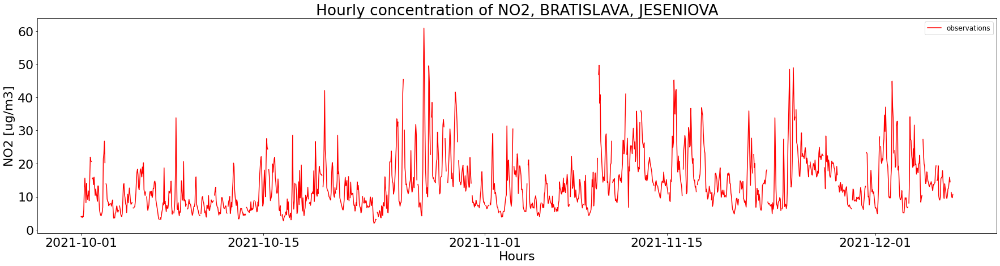

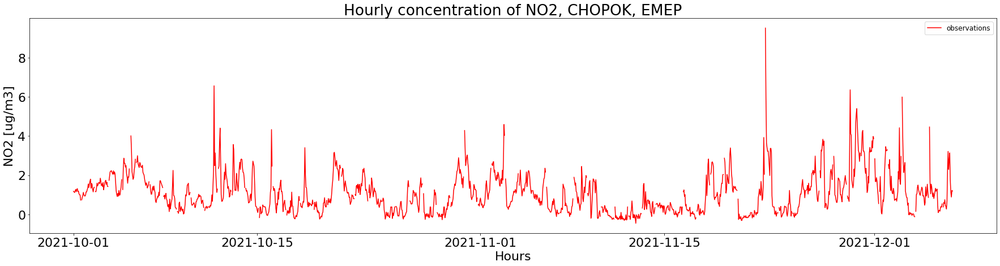

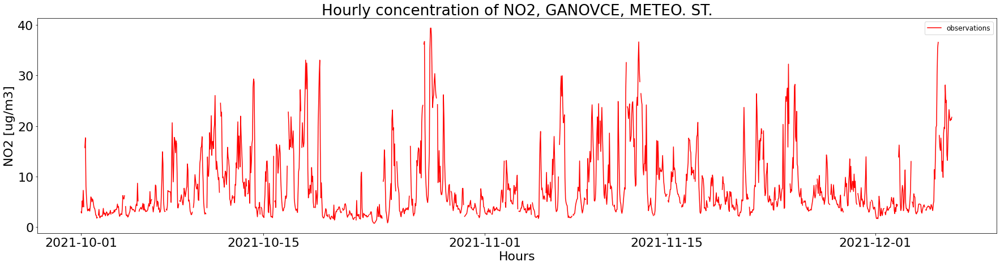

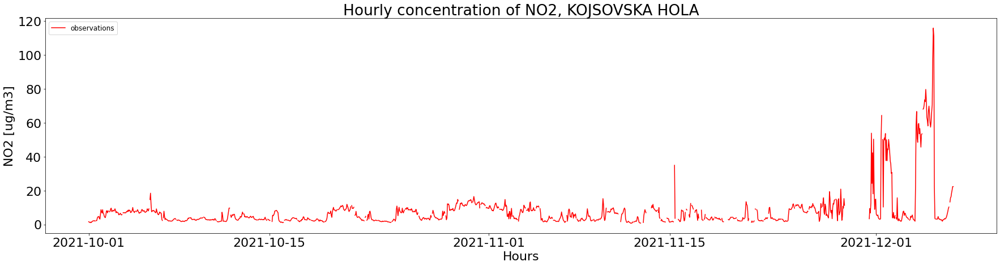

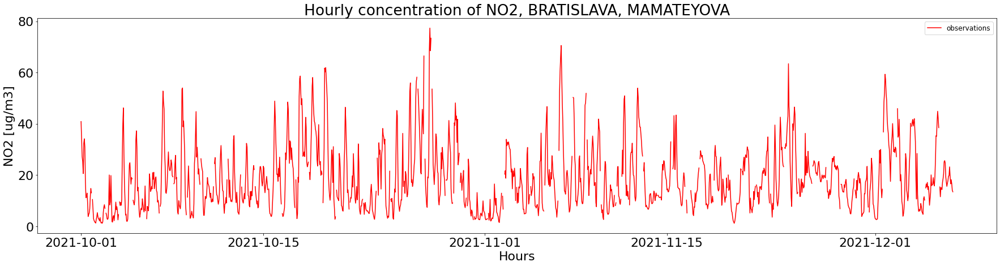

...

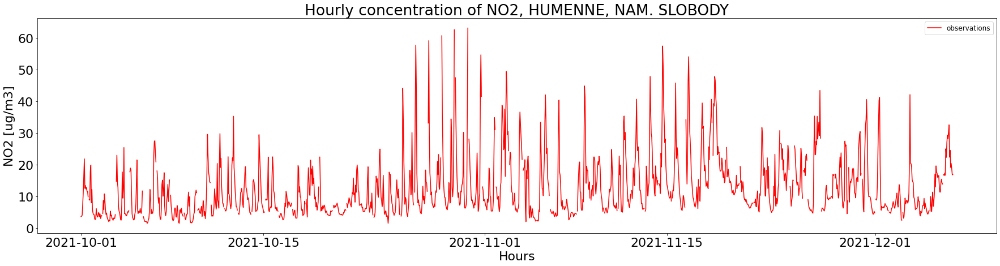

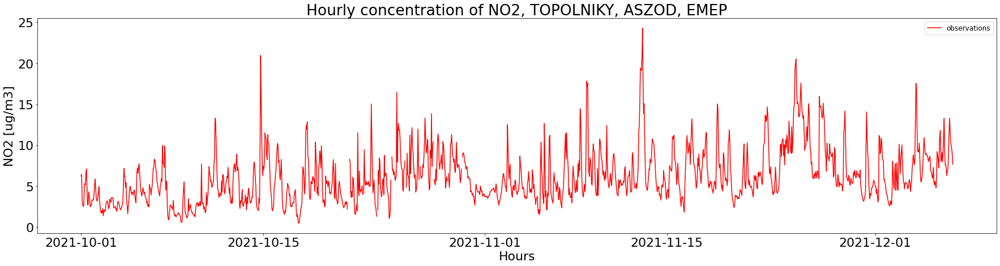

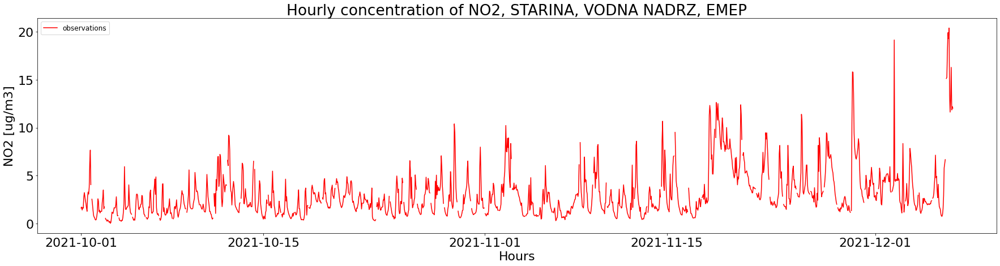

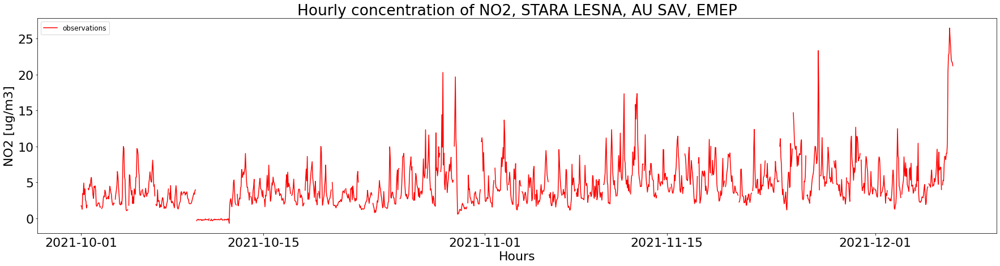

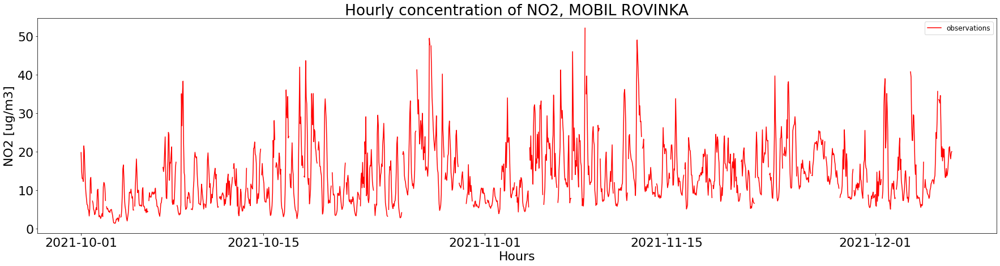

In [112]:
if save:
    print('Plots will be saved at:{}'.format(save_path))
for i in ID:    
    
    obs_id = data[v]['OBS'].sel(station = i).to_series()[plot_from:plot_until]
    name_sta = stat[v].name.loc[stat[v].index == i].item()
    
    plt.rcParams['figure.figsize'] = 25,7
    plt.rcParams.update({'font.size': 22})

    plt.plot(obs_id.index[:], obs_id[:], color = 'r', label = 'observations')                

    plt.legend(fontsize=12)                
    plt.title('Hourly concentration of {0}, {1}'.format(v,name_sta))                               
    plt.xlabel('Hours')
    plt.ylabel('{0} [{1}]'.format(v,units))
    plt.tight_layout()

    if save:
        if not os.path.exists(save_path):
            os.makedirs(save_path)
        plt.savefig('{0}/{1}_{2}_{3}_{4}_H{5}-{6}.png'.format(save_path,nick, start_date[0:4], v, i,plot_from,plot_until), dpi=300)                
    plt.show()                
    plt.close()

## Priemerne denne koncentracie

In [113]:
### USER INPUT
# Choose stations to plot
ID = list(stat_all.loc[stat_all.coverage != 0].index.values)[1:]
#ID = [11813,11916]    # selected stations
save = False   # save the plots?

plot_from = '2021-10-01'
plot_until = '2021-12-06'  

save_path = '{0}/validated/{1}_{2}/graphs/{3}'.format(vali_path, nick, start_date[0:4],v)

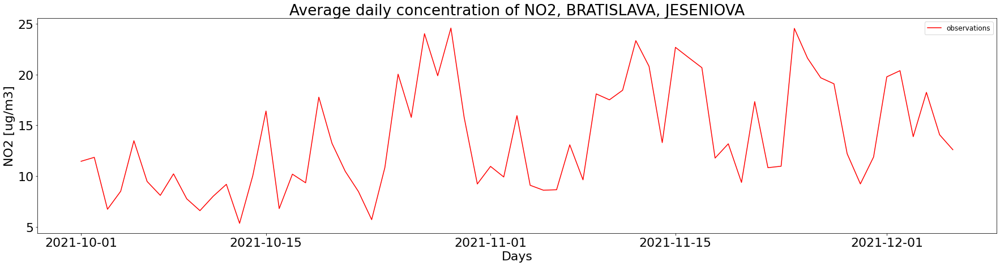

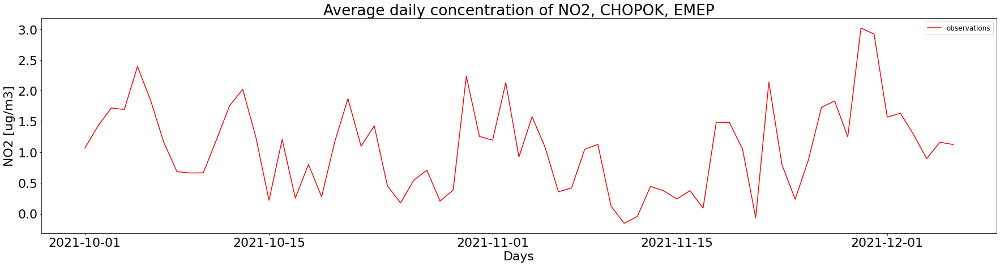

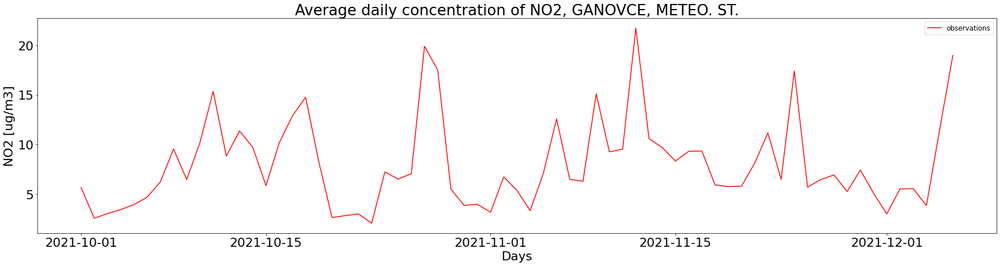

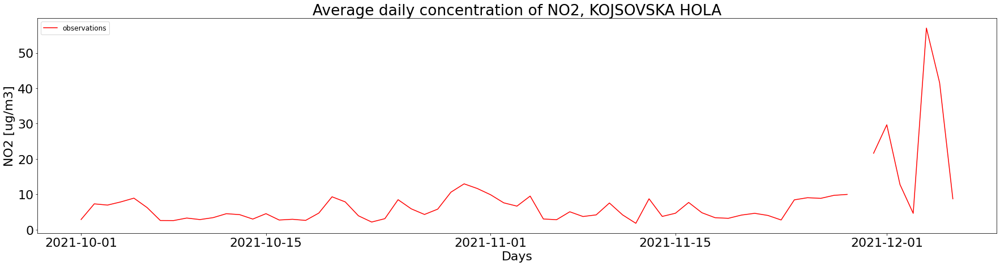

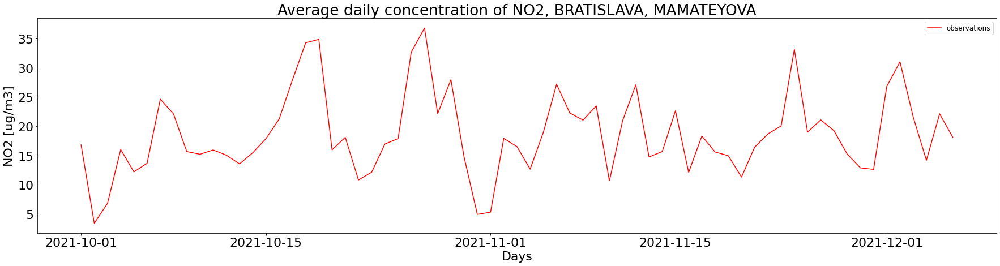

...

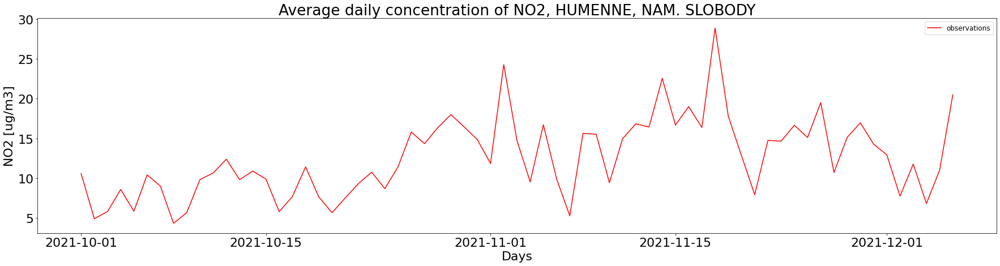

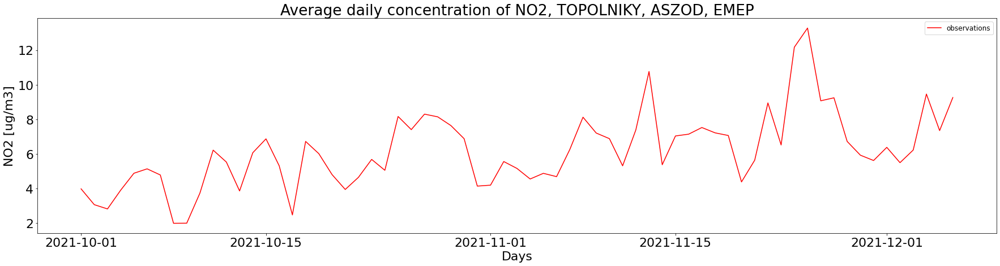

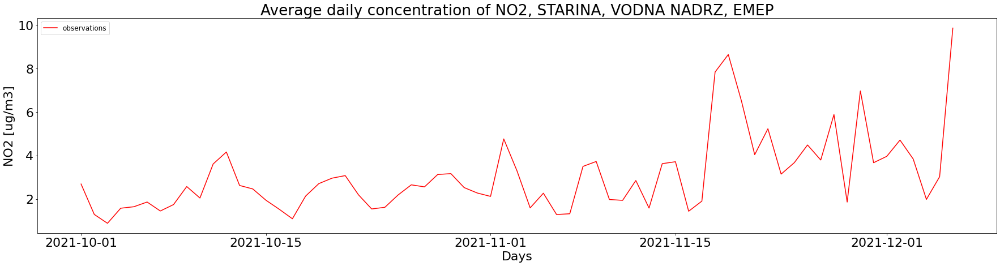

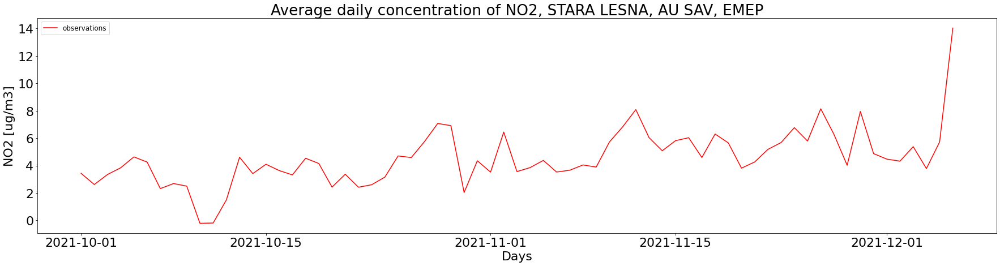

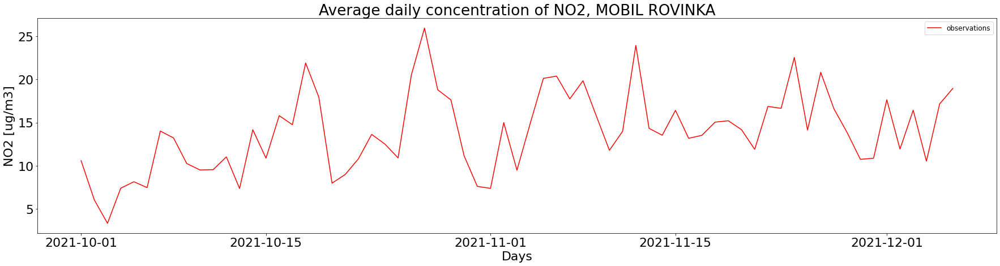

In [114]:
if save:
    print('Plots will be saved at:{}'.format(save_path))
for i in ID:    
    
    obs_id = data[v]['OBS'].sel(station = i).to_series()[plot_from:plot_until]
    daily_obs = obs_id.groupby(pd.Grouper(freq='D')).mean()
    name_sta = stat[v].name.loc[stat[v].index == i].item()
    
    plt.rcParams['figure.figsize'] = 25,7
    plt.rcParams.update({'font.size': 22})

    plt.plot(daily_obs.index[:], daily_obs[:], color = 'r', label = 'observations')                

    plt.legend(fontsize=12)                
    plt.title('Average daily concentration of {0}, {1}'.format(v,name_sta))                               
    plt.xlabel('Days')
    plt.ylabel('{0} [{1}]'.format(v,units))
    plt.tight_layout()

    if save:
        if not os.path.exists(save_path):
            os.makedirs(save_path)
        plt.savefig('{0}/{1}_{2}_{3}_{4}_D{5}-{6}.png'.format(save_path,nick, start_date[0:4], v, i,plot_from,plot_until), dpi=300)                
    plt.show()                
    plt.close()

## Tyzdenne priemery

In [115]:
### USER INPUT
# Choose stations to plot
ID = list(stat_all.loc[stat_all.coverage != 0].index.values)[1:]
#ID = [11813,11916]    # selected stations
save = False   # save the plots?

plot_from = '2021-10-01'
plot_until = '2021-12-06'  

save_path = '{0}/validated/{1}_{2}/graphs/{3}'.format(vali_path, nick, start_date[0:4],v)

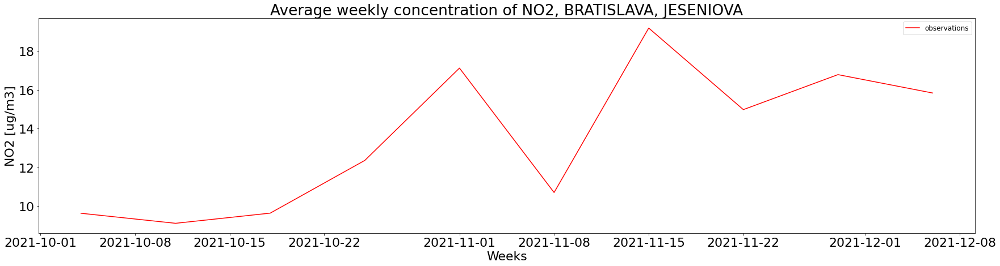

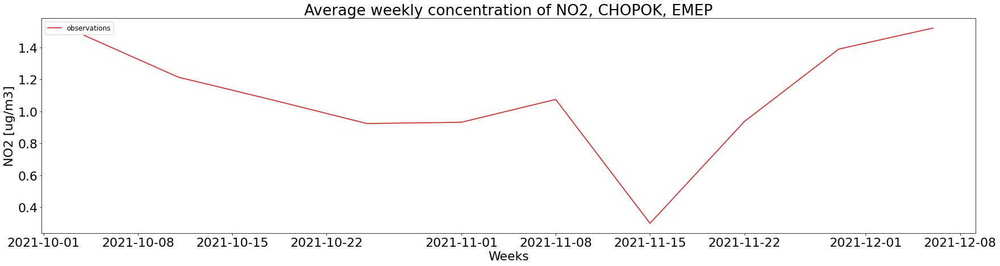

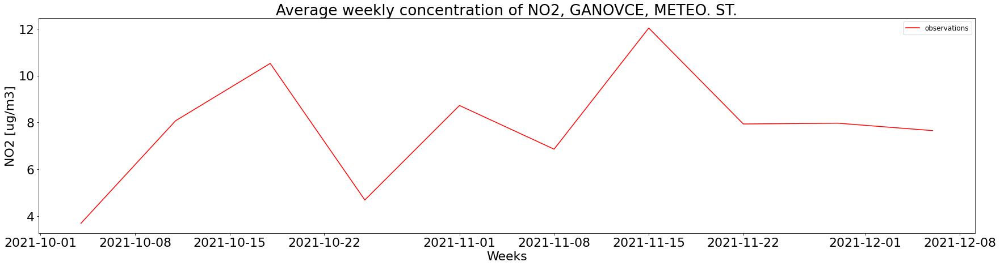

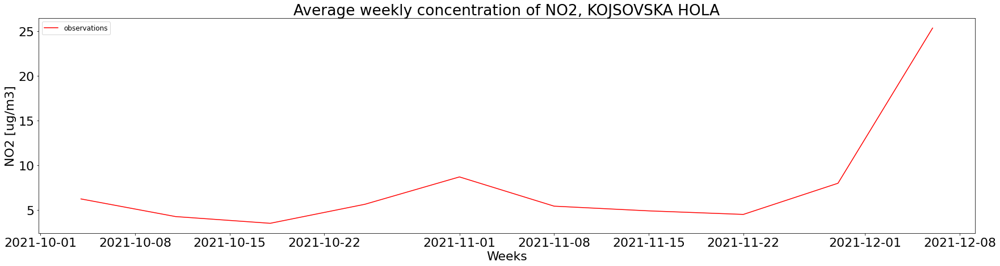

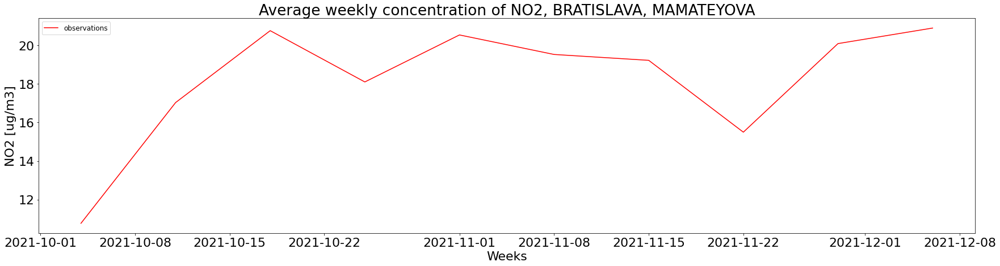

...

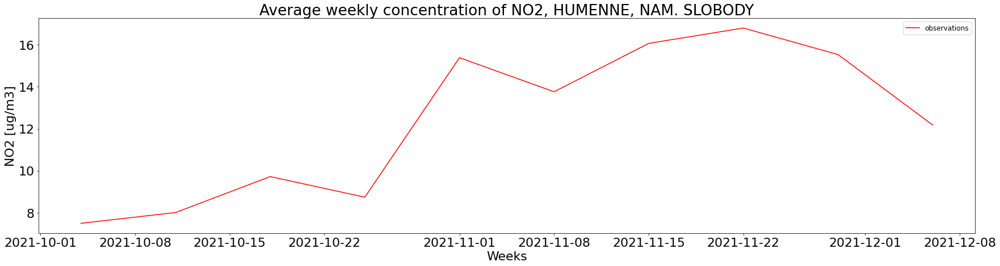

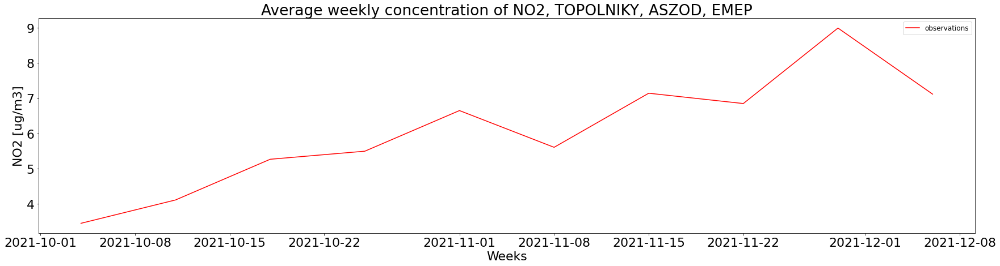

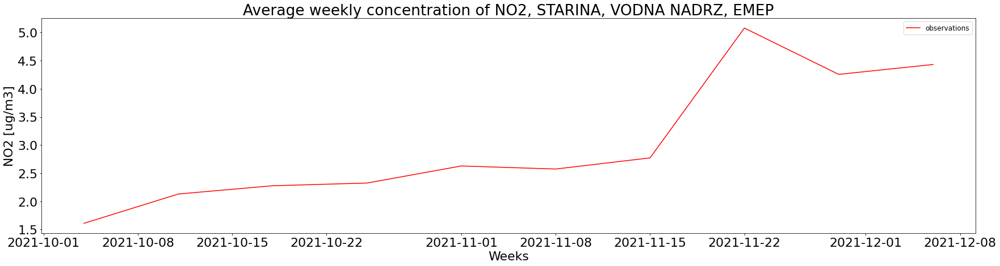

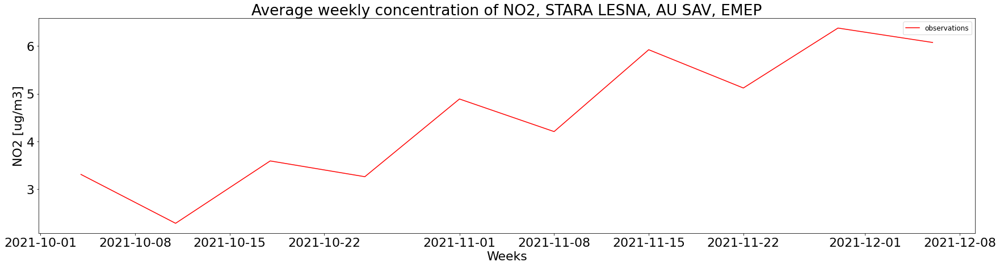

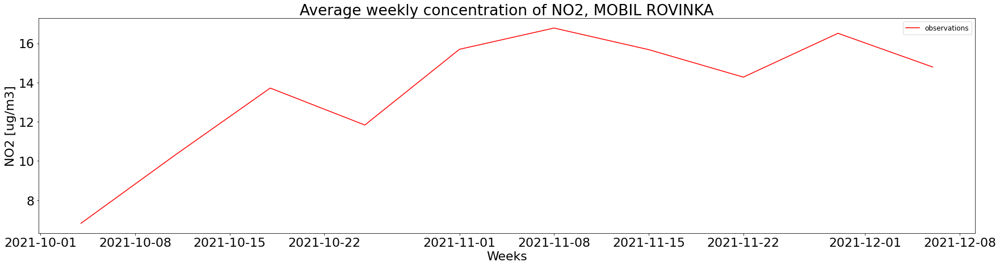

In [116]:
if save:
    print('Plots will be saved at:{}'.format(save_path))
for i in ID:    
    
    obs_id = data[v]['OBS'].sel(station = i).to_series()[plot_from:plot_until]
    daily_obs = obs_id.groupby(pd.Grouper(freq='W-MON')).mean()
    name_sta = stat[v].name.loc[stat[v].index == i].item()
    
    plt.rcParams['figure.figsize'] = 25,7
    plt.rcParams.update({'font.size': 22})

    plt.plot(daily_obs.index[:], daily_obs[:], color = 'r', label = 'observations')                

    plt.legend(fontsize=12)                
    plt.title('Average weekly concentration of {0}, {1}'.format(v,name_sta))                               
    plt.xlabel('Weeks')
    plt.ylabel('{0} [{1}]'.format(v,units))
    plt.tight_layout()

    if save:
        if not os.path.exists(save_path):
            os.makedirs(save_path)
        plt.savefig('{0}/{1}_{2}_{3}_{4}_W{5}-{6}.png'.format(save_path,nick, start_date[0:4], v, i,plot_from,plot_until), dpi=300)                
    plt.show()                
    plt.close()

### Vsetky stanice

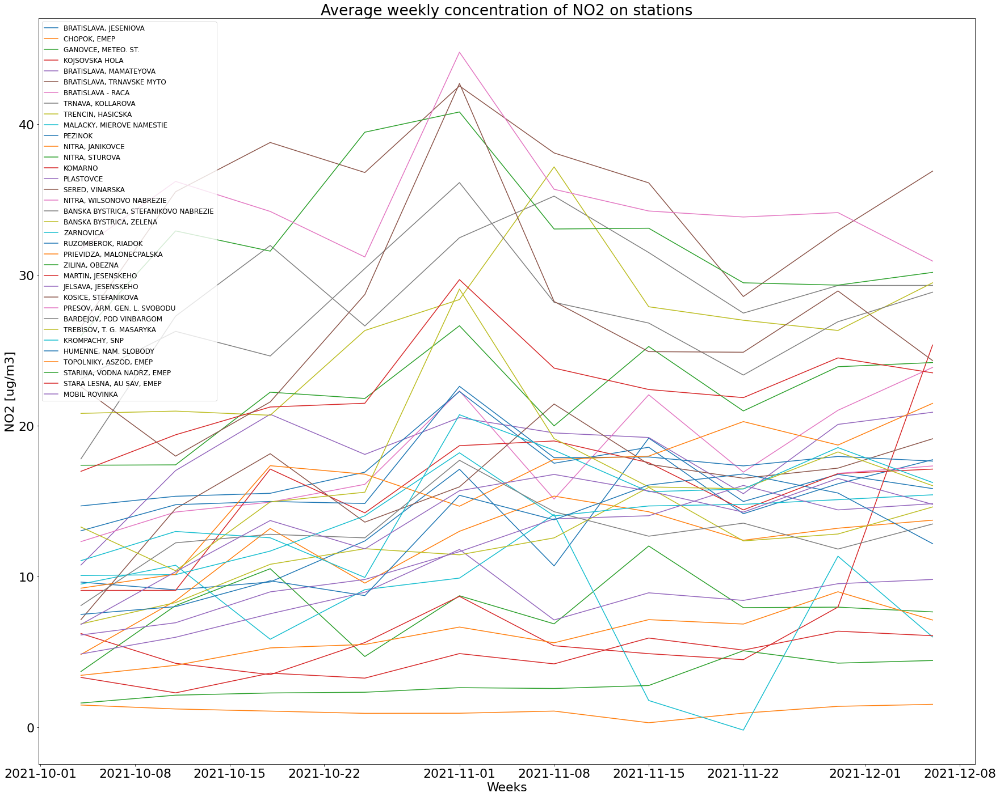

In [117]:
if save:
    print('Plots will be saved at:{}'.format(save_path))   

plt.rcParams['figure.figsize'] = 25,20
plt.rcParams.update({'font.size': 22})

for i in ID: 
    name_sta = stat[v].name.loc[stat[v].index == i].item()
    obs_id = data[v]['OBS'].sel(station = i).to_series()[plot_from:plot_until]
    daily_obs = obs_id.groupby(pd.Grouper(freq='W-MON')).mean()
    plt.plot(daily_obs.index[:], daily_obs[:], label = '{0}'.format(name_sta))  

plt.legend(fontsize=12)                
plt.title('Average weekly concentration of {0} on stations'.format(v))                               
plt.xlabel('Weeks')
plt.ylabel('{0} [{1}]'.format(v,units))
plt.tight_layout()

if save:
    if not os.path.exists(save_path):
        os.makedirs(save_path)
    plt.savefig('{0}/{1}_{2}_{3}_{4}_W_all{5}-{6}.png'.format(save_path,nick, start_date[0:4], v, i,plot_from,plot_until), dpi=300)                
plt.show()                
plt.close()

## Priemery pre vsetky stanice

In [118]:
### USER INPUT
# Choose stations to plot
ID = list(stat_all.loc[stat_all.coverage != 0].index.values)[1:]
#ID = [11813,11916]    # selected stations
save = False   # save the plots?

plot_from = '2021-10-01'
plot_until = '2021-12-06'  

save_path = '{0}/validated/{1}_{2}/graphs/{3}'.format(vali_path, nick, start_date[0:4],v)

### Tyzdenny

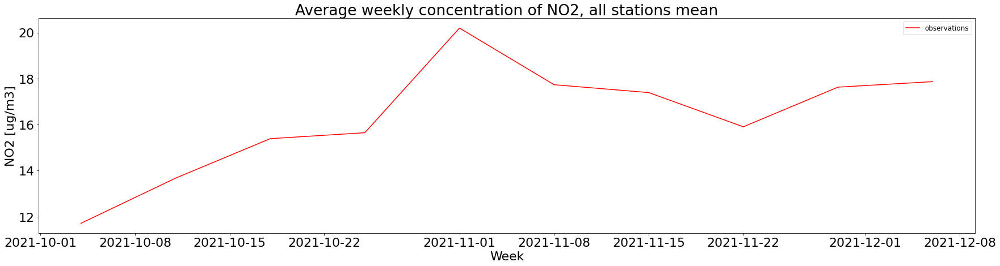

In [119]:
if save:
    print('Plots will be saved at:{}'.format(save_path))    
    
obs_id = data[v]['OBS'].sel(station = ID).mean(dim = 'station').to_series()[plot_from:plot_until]
daily_obs = obs_id.groupby(pd.Grouper(freq='W-MON')).mean()
name_sta = stat[v].name.loc[stat[v].index == i].item()

plt.rcParams['figure.figsize'] = 25,7
plt.rcParams.update({'font.size': 22})

plt.plot(daily_obs.index[:], daily_obs[:], color = 'r', label = 'observations')                

plt.legend(fontsize=12)                
plt.title('Average weekly concentration of {0}, all stations mean'.format(v))                               
plt.xlabel('Week')
plt.ylabel('{0} [{1}]'.format(v,units))
plt.tight_layout()

if save:
    if not os.path.exists(save_path):
        os.makedirs(save_path)
    plt.savefig('{0}/{1}_{2}_{3}_{4}_W{5}-{6}.png'.format(save_path,nick, start_date[0:4], v, i,plot_from,plot_until), dpi=300)                
plt.show()                
plt.close()

In [120]:
daily_obs

time
2021-10-04    11.707848
2021-10-11    13.671519
2021-10-18    15.387069
2021-10-25    15.645937
2021-11-01    20.196494
2021-11-08    17.733513
2021-11-15    17.391585
2021-11-22    15.903431
2021-11-29    17.627176
2021-12-06    17.866450
Freq: W-MON, Name: OBS, dtype: float64

### Denny

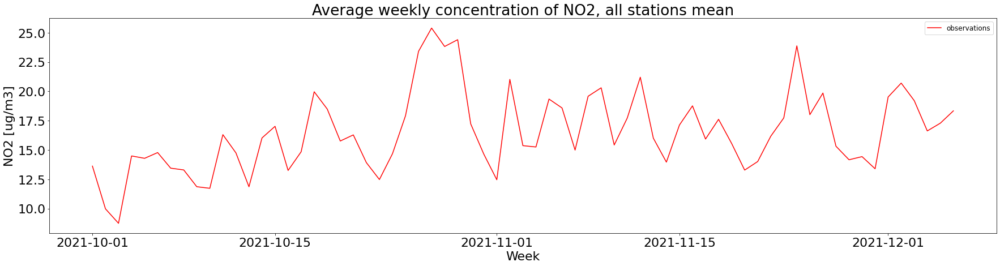

In [121]:
if save:
    print('Plots will be saved at:{}'.format(save_path))    
    
obs_id = data[v]['OBS'].sel(station = ID).mean(dim = 'station').to_series()[plot_from:plot_until]
daily_obs = obs_id.groupby(pd.Grouper(freq='D')).mean()
name_sta = stat[v].name.loc[stat[v].index == i].item()

plt.rcParams['figure.figsize'] = 25,7
plt.rcParams.update({'font.size': 22})

plt.plot(daily_obs.index[:], daily_obs[:], color = 'r', label = 'observations')                

plt.legend(fontsize=12)                
plt.title('Average weekly concentration of {0}, all stations mean'.format(v))                               
plt.xlabel('Week')
plt.ylabel('{0} [{1}]'.format(v,units))
plt.tight_layout()

if save:
    if not os.path.exists(save_path):
        os.makedirs(save_path)
    plt.savefig('{0}/{1}_{2}_{3}_{4}_W{5}-{6}.png'.format(save_path,nick, start_date[0:4], v, i,plot_from,plot_until), dpi=300)                
plt.show()                
plt.close()